# Libraries

In [1]:
import os
import pandas as pd

from src.data_preparation.data_cleaning import DataMissing, DataCharts, DataPreprocess
from src.config import Config

# Check top 45 countries

In [2]:
config = Config()
df = pd.read_csv(config.intermediate_data_file_name)
df

,year,country,iso_code,population,gdp,primary_energy_consumption,temperature_change_from_co2,total_ghg,cement_co2,coal_co2,consumption_co2,flaring_co2,gas_co2,land_use_change_co2,oil_co2,other_industry_co2,trade_co2,co2_including_luc,cumulative_co2_including_luc
0,1850,Argentina,ARG,1088372.0,2.193400e+09,NaN,NaN,30.306,NaN,NaN,NaN,NaN,NaN,11.577,NaN,NaN,NaN,NaN,NaN
1,1851,Argentina,ARG,1115018.0,NaN,NaN,0.000,31.370,NaN,NaN,NaN,NaN,NaN,12.115,NaN,NaN,NaN,NaN,NaN
2,1852,Argentina,ARG,1138141.0,NaN,NaN,0.000,32.277,NaN,NaN,NaN,NaN,NaN,12.040,NaN,NaN,NaN,NaN,NaN
3,1853,Argentina,ARG,1157536.0,NaN,NaN,0.000,33.218,NaN,NaN,NaN,NaN,NaN,12.141,NaN,NaN,NaN,NaN,NaN
4,1854,Argentina,ARG,1177263.0,NaN,NaN,0.000,34.165,NaN,NaN,NaN,NaN,NaN,12.208,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8565,2019,Vietnam,VNM,97173778.0,7.316531e+11,1202.636,0.006,543.980,56.538,191.443,226.083,1.453,18.906,103.356,70.808,NaN,-113.064,442.503,12266.853
8566,2020,Vietnam,VNM,98079196.0,7.526296e+11,1204.393,0.006,560.892,60.066,215.817,239.969,1.257,16.931,98.147,68.389,NaN,-122.491,460.607,12727.459
8567,2021,Vietnam,VNM,98935101.0,7.719120e+11,1208.554,0.006,517.077,62.071,172.395,203.597,0.995,14.436,99.431,64.076,NaN,-110.376,413.404,13140.863
8568,2022,Vietnam,VNM,99680656.0,8.338038e+11,1244.068,0.006,500.590,55.979,157.181,192.952,1.110,15.636,98.130,67.727,NaN,-104.682,395.764,13536.627


1. Check numerical values. Look for missing values.

In [3]:
data_missing = DataMissing()
data_missing.missing_values(df)

year                             0.000000
country                          0.000000
iso_code                         0.000000
population                       2.357060
gdp                             36.359393
primary_energy_consumption      70.945158
temperature_change_from_co2      9.159860
total_ghg                        8.634772
cement_co2                      41.750292
coal_co2                        17.946324
consumption_co2                 83.453909
flaring_co2                     20.746791
gas_co2                         20.746791
land_use_change_co2              8.634772
oil_co2                         20.746791
other_industry_co2              89.521587
trade_co2                       83.453909
co2_including_luc               23.640607
cumulative_co2_including_luc    23.640607
dtype: float64

2. Charts co2 by year by top 45 countries

In [4]:
year_column = 'year'
entity_column = 'country'

data_charts = DataCharts(year_column, entity_column)
data_preprocess = DataPreprocess(year_column, entity_column)

2a. Check 'co2_including_luc' column

/Users/majarusak/Desktop/Areas/Praca_magisterska/co2_repo/src/data_preparation/data_cleaning.py:122: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


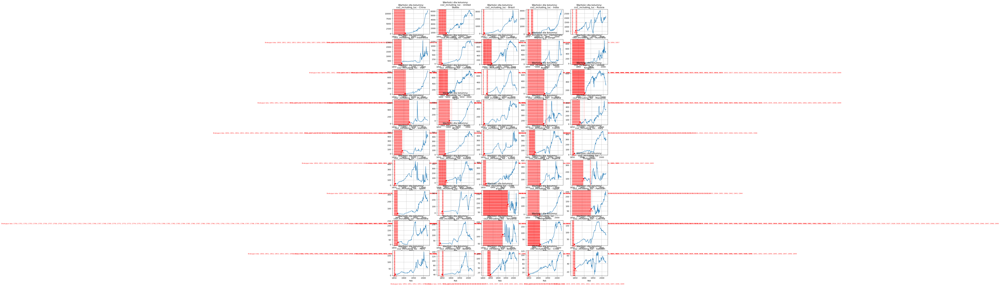

In [5]:
column_co2 = 'co2_including_luc'
data_charts.chart_missing_values(df, column_co2)

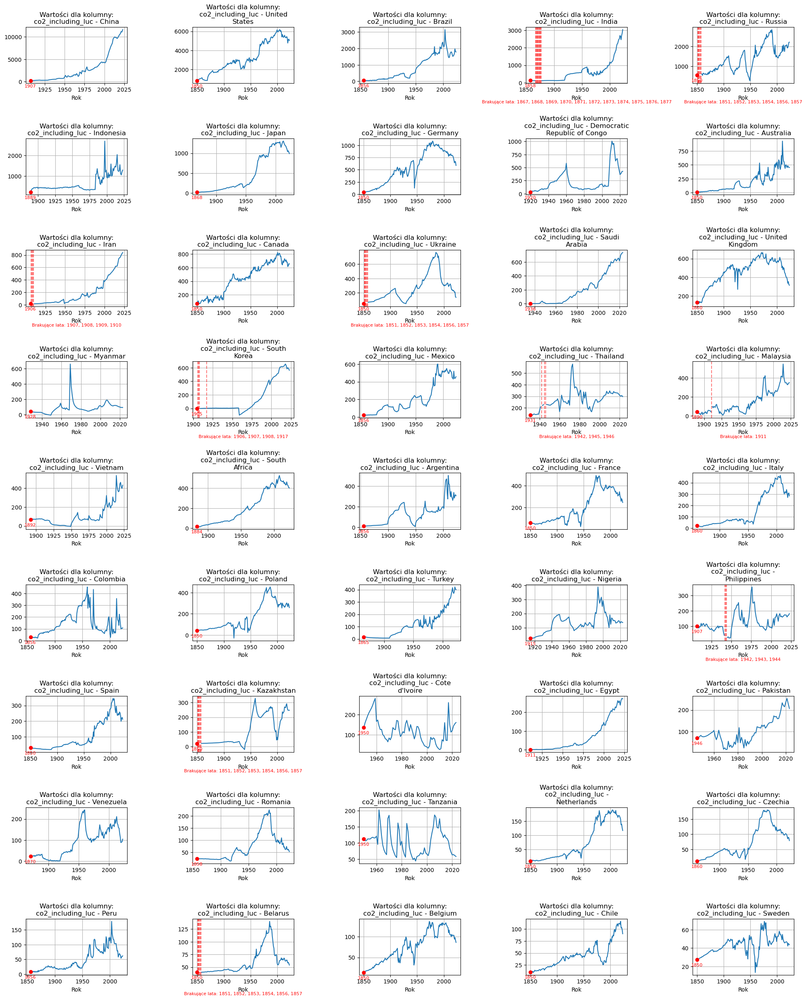

In [6]:
# Process data by removing missing values before the first non-null value
processed1_df_before = data_preprocess.apply_process_country_data(df, column_co2, data_preprocess.process_country_data_before)
data_charts.chart_missing_values(processed1_df_before, column_co2)

In [7]:
data_missing.missing_values(processed1_df_before)

year                             0.000000
country                          0.000000
iso_code                         0.000000
population                       0.000000
gdp                             22.065514
primary_energy_consumption      62.238399
temperature_change_from_co2      0.242645
total_ghg                        0.000000
cement_co2                      29.602669
coal_co2                         0.773430
consumption_co2                 78.495602
flaring_co2                      5.156203
gas_co2                          5.156203
land_use_change_co2              0.000000
oil_co2                          5.156203
other_industry_co2              86.381559
trade_co2                       78.495602
co2_including_luc                0.758265
cumulative_co2_including_luc     0.758265
dtype: float64

In [8]:
# Check missing values for each country
data_missing.calculate_missing_values_percentage(processed1_df_before, entity_column, column_co2)

,country,missing_percentage
0,India,6.626506
1,Belarus,3.448276
2,Ukraine,3.448276
3,Kazakhstan,3.448276
4,Russia,3.448276
5,Iran,3.389831
6,South Korea,3.361345
7,Thailand,3.225806
8,Philippines,2.564103
9,Malaysia,0.746269


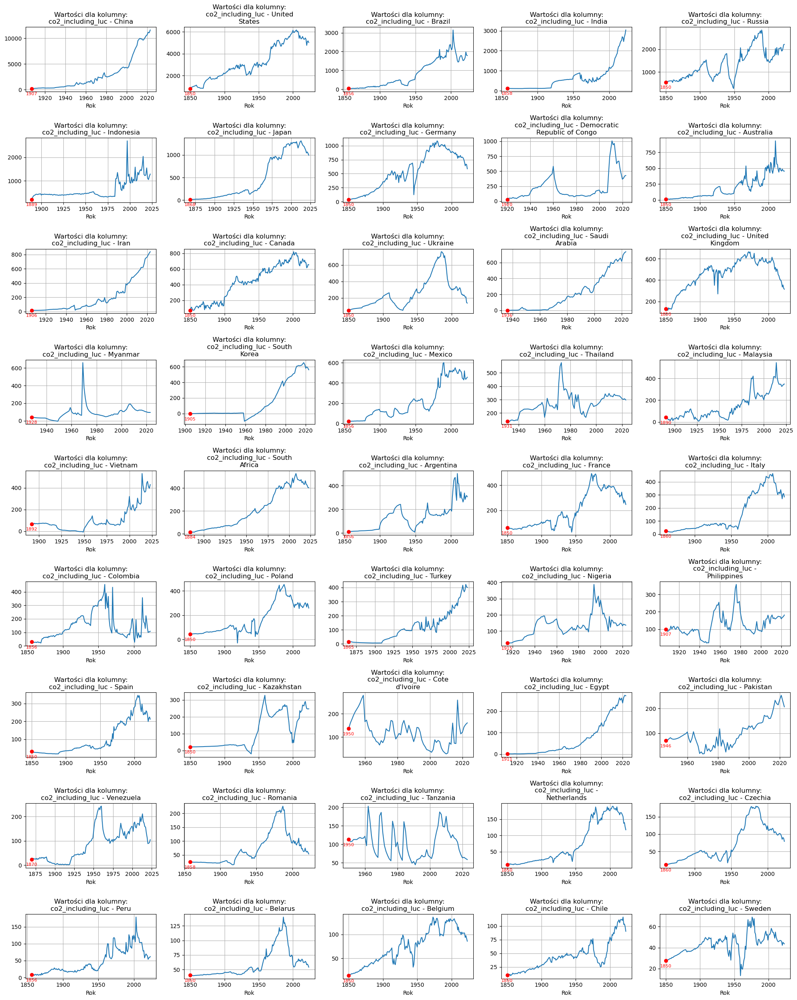

In [9]:
# Process data by filling missing values - max 7% are missing
processed1_df_fill = data_preprocess.apply_process_country_data(processed1_df_before, column_co2, data_preprocess.process_country_data_fill)
data_charts.chart_missing_values(processed1_df_fill, column_co2)

In [10]:
data_missing.missing_values(processed1_df_fill)

year                             0.000000
country                          0.000000
iso_code                         0.000000
population                       0.000000
gdp                             22.065514
primary_energy_consumption      62.238399
temperature_change_from_co2      0.242645
total_ghg                        0.000000
cement_co2                      29.602669
coal_co2                         0.773430
consumption_co2                 78.495602
flaring_co2                      5.156203
gas_co2                          5.156203
land_use_change_co2              0.000000
oil_co2                          5.156203
other_industry_co2              86.381559
trade_co2                       78.495602
co2_including_luc                0.000000
cumulative_co2_including_luc     0.758265
dtype: float64

2b. Remove columns with missing values related to co2 ​​greater than 50% + 'iso_code' amd 'cumulative_co2_including_luc' column which is not significant

In [11]:
processed2_df = processed1_df_fill.drop(columns={'iso_code', 'consumption_co2', 'other_industry_co2', 'trade_co2', 'cumulative_co2_including_luc'})
processed2_df

,year,country,population,gdp,primary_energy_consumption,temperature_change_from_co2,total_ghg,cement_co2,coal_co2,flaring_co2,gas_co2,land_use_change_co2,oil_co2,co2_including_luc
0,1856,Argentina,1217730.0,NaN,NaN,0.000,36.086,NaN,0.017,NaN,NaN,12.442,NaN,12.459
1,1857,Argentina,1238482.0,NaN,NaN,0.000,37.084,NaN,0.041,NaN,NaN,12.537,NaN,12.578
2,1858,Argentina,1259588.0,NaN,NaN,0.000,38.103,NaN,0.053,NaN,NaN,12.749,NaN,12.802
3,1859,Argentina,1285058.0,NaN,NaN,0.000,39.015,NaN,0.034,NaN,NaN,12.826,NaN,12.860
4,1860,Argentina,1315097.0,NaN,NaN,0.000,40.301,NaN,0.042,NaN,NaN,13.740,NaN,13.781
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6589,2019,Vietnam,97173778.0,7.316531e+11,1202.636,0.006,543.980,56.538,191.443,1.453,18.906,103.356,70.808,442.503
6590,2020,Vietnam,98079196.0,7.526296e+11,1204.393,0.006,560.892,60.066,215.817,1.257,16.931,98.147,68.389,460.607
6591,2021,Vietnam,98935101.0,7.719120e+11,1208.554,0.006,517.077,62.071,172.395,0.995,14.436,99.431,64.076,413.404
6592,2022,Vietnam,99680656.0,8.338038e+11,1244.068,0.006,500.590,55.979,157.181,1.110,15.636,98.130,67.727,395.764


In [12]:
data_missing.missing_values(processed2_df)

year                            0.000000
country                         0.000000
population                      0.000000
gdp                            22.065514
primary_energy_consumption     62.238399
temperature_change_from_co2     0.242645
total_ghg                       0.000000
cement_co2                     29.602669
coal_co2                        0.773430
flaring_co2                     5.156203
gas_co2                         5.156203
land_use_change_co2             0.000000
oil_co2                         5.156203
co2_including_luc               0.000000
dtype: float64

2c. Check 'coal_co2' column

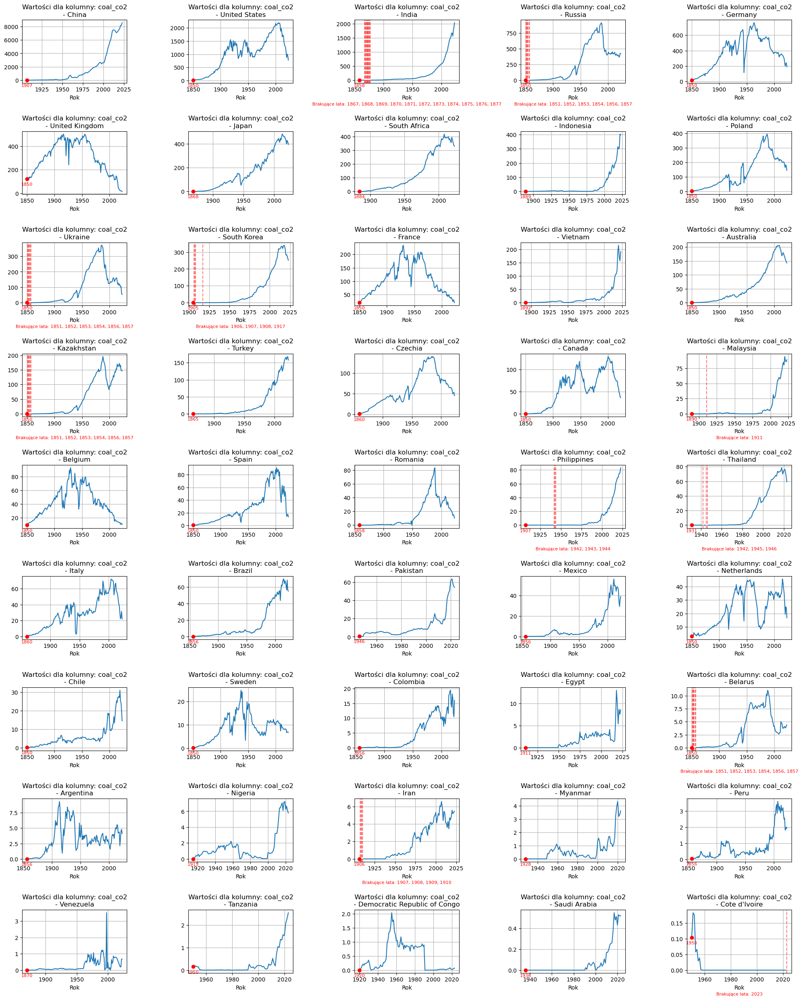

In [13]:
column_coal = 'coal_co2'
data_charts.chart_missing_values(processed2_df, column_coal)

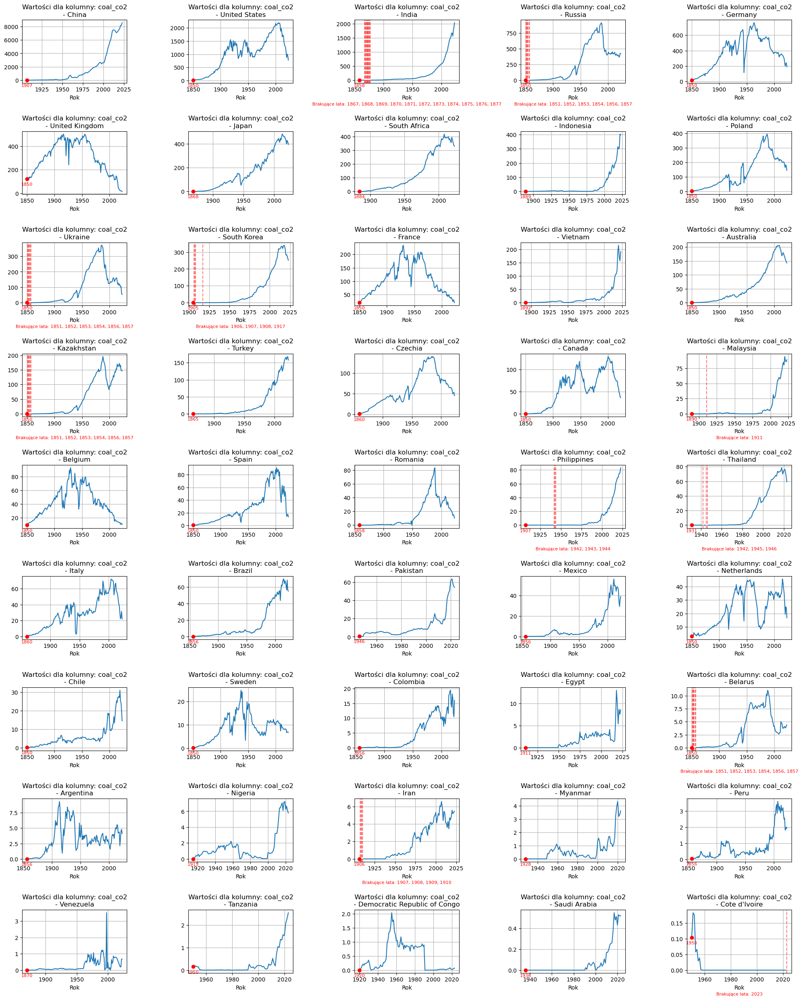

In [14]:
# Process data by removing missing values before the first non-null value
processed3_df_before = data_preprocess.apply_process_country_data(processed2_df, column_coal, data_preprocess.process_country_data_before)
data_charts.chart_missing_values(processed3_df_before, column_coal)

In [15]:
data_missing.missing_values(processed3_df_before)

year                            0.000000
country                         0.000000
population                      0.000000
gdp                            22.065514
primary_energy_consumption     62.238399
temperature_change_from_co2     0.242645
total_ghg                       0.000000
cement_co2                     29.602669
coal_co2                        0.773430
flaring_co2                     5.156203
gas_co2                         5.156203
land_use_change_co2             0.000000
oil_co2                         5.156203
co2_including_luc               0.000000
dtype: float64

In [16]:
# Check missing values for each country
data_missing.calculate_missing_values_percentage(processed3_df_before, entity_column, column_coal)

,country,missing_percentage
0,India,6.626506
1,Belarus,3.448276
2,Ukraine,3.448276
3,Kazakhstan,3.448276
4,Russia,3.448276
5,Iran,3.389831
6,South Korea,3.361345
7,Thailand,3.225806
8,Philippines,2.564103
9,Cote d'Ivoire,1.351351


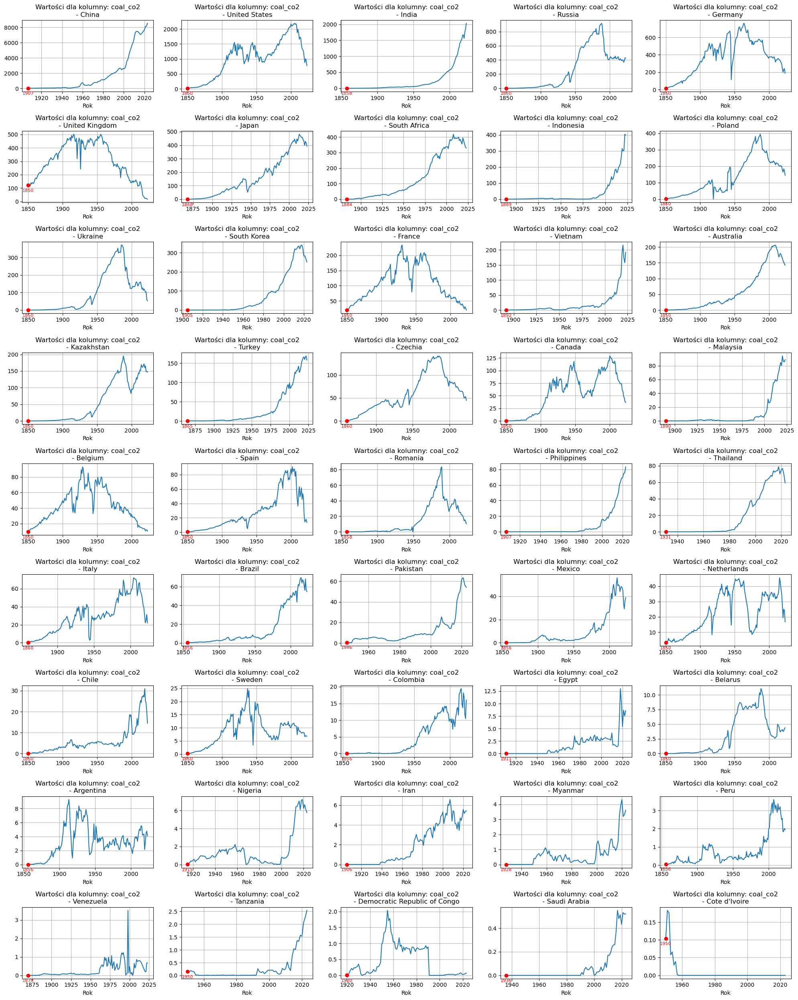

In [17]:
# Process data by filling missing values - max 7% are missing (because this is the same % for coal_co2 I use fill to all of that columns)
processed3_df_fill = data_preprocess.apply_process_country_data(processed3_df_before, column_coal, data_preprocess.process_country_data_fill)
data_charts.chart_missing_values(processed3_df_fill, column_coal)

In [18]:
data_missing.missing_values(processed3_df_fill)

year                            0.000000
country                         0.000000
population                      0.000000
gdp                            22.065514
primary_energy_consumption     62.238399
temperature_change_from_co2     0.242645
total_ghg                       0.000000
cement_co2                     29.602669
coal_co2                        0.000000
flaring_co2                     5.156203
gas_co2                         5.156203
land_use_change_co2             0.000000
oil_co2                         5.156203
co2_including_luc               0.000000
dtype: float64

2d. Check 'oil_co2' column

/Users/majarusak/Desktop/Areas/Praca_magisterska/co2_repo/src/data_preparation/data_cleaning.py:122: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.tight_layout()


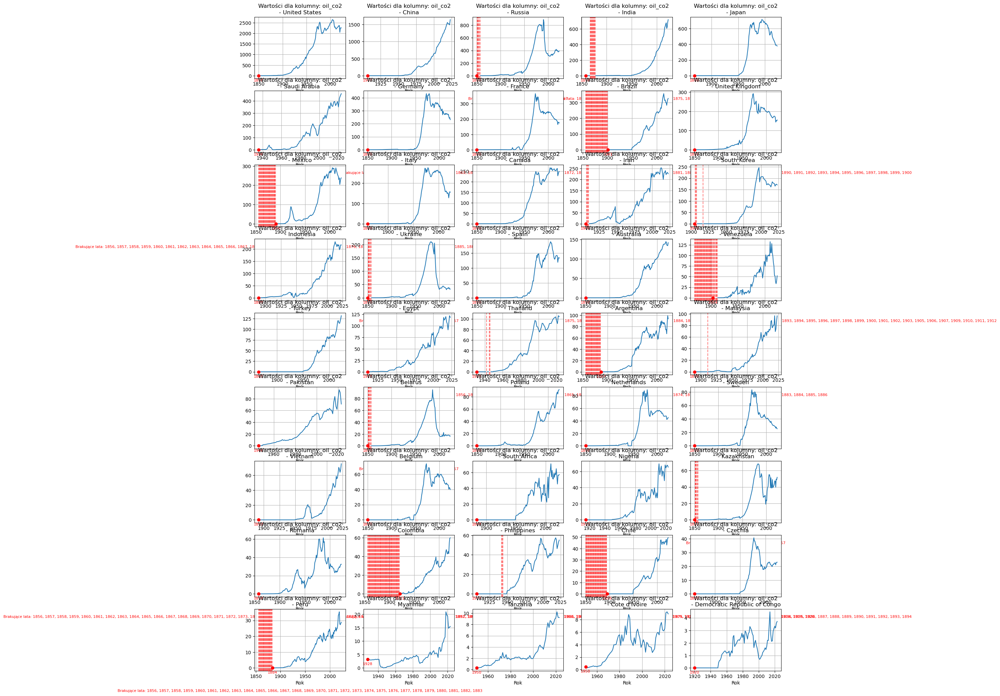

In [19]:
column_oil = 'oil_co2'
data_charts.chart_missing_values(processed3_df_fill, column_oil)

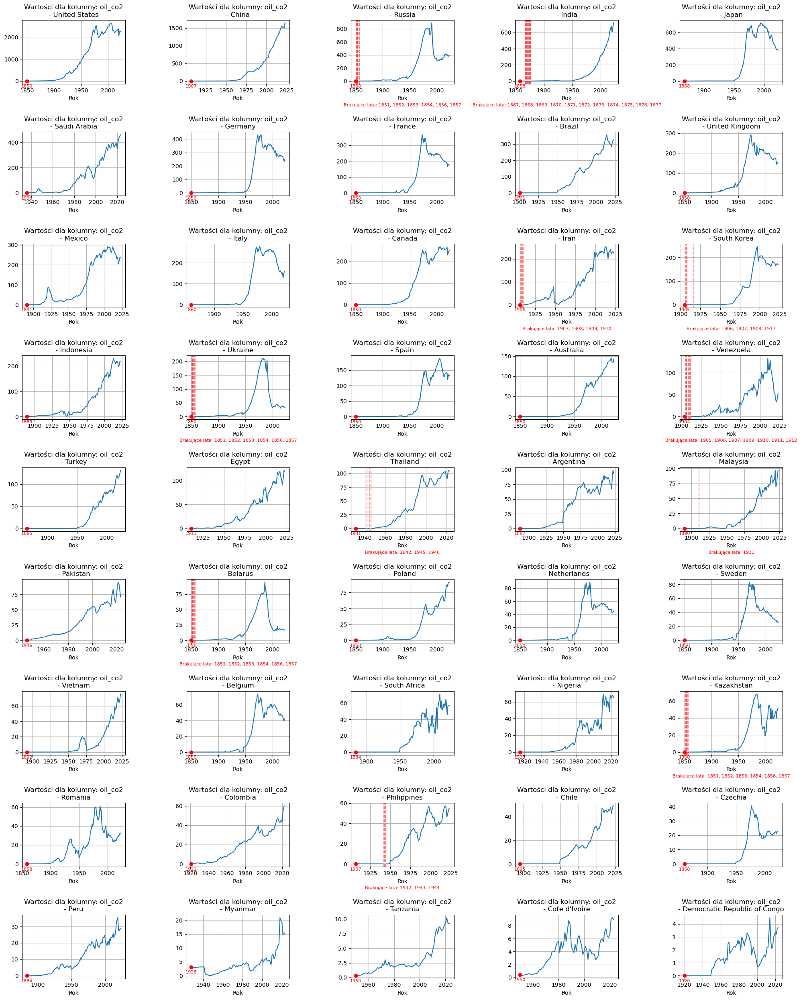

In [20]:
# Process data by removing missing values before the first non-null value
processed4_df_before = data_preprocess.apply_process_country_data(processed3_df_fill, column_oil, data_preprocess.process_country_data_before)
data_charts.chart_missing_values(processed4_df_before, column_oil)

In [21]:
data_missing.missing_values(processed4_df_before)

year                            0.000000
country                         0.000000
population                      0.000000
gdp                            20.741562
primary_energy_consumption     60.545080
temperature_change_from_co2     0.237680
total_ghg                       0.000000
cement_co2                     26.445888
coal_co2                        0.000000
flaring_co2                     0.903185
gas_co2                         0.903185
land_use_change_co2             0.000000
oil_co2                         0.903185
co2_including_luc               0.000000
dtype: float64

In [22]:
# Check missing values for each country
data_missing.calculate_missing_values_percentage(processed4_df_before, entity_column, column_oil)

,country,missing_percentage
0,India,6.626506
1,Venezuela,5.833333
2,Belarus,3.448276
3,Ukraine,3.448276
4,Kazakhstan,3.448276
5,Russia,3.448276
6,Iran,3.389831
7,South Korea,3.361345
8,Thailand,3.225806
9,Philippines,2.564103


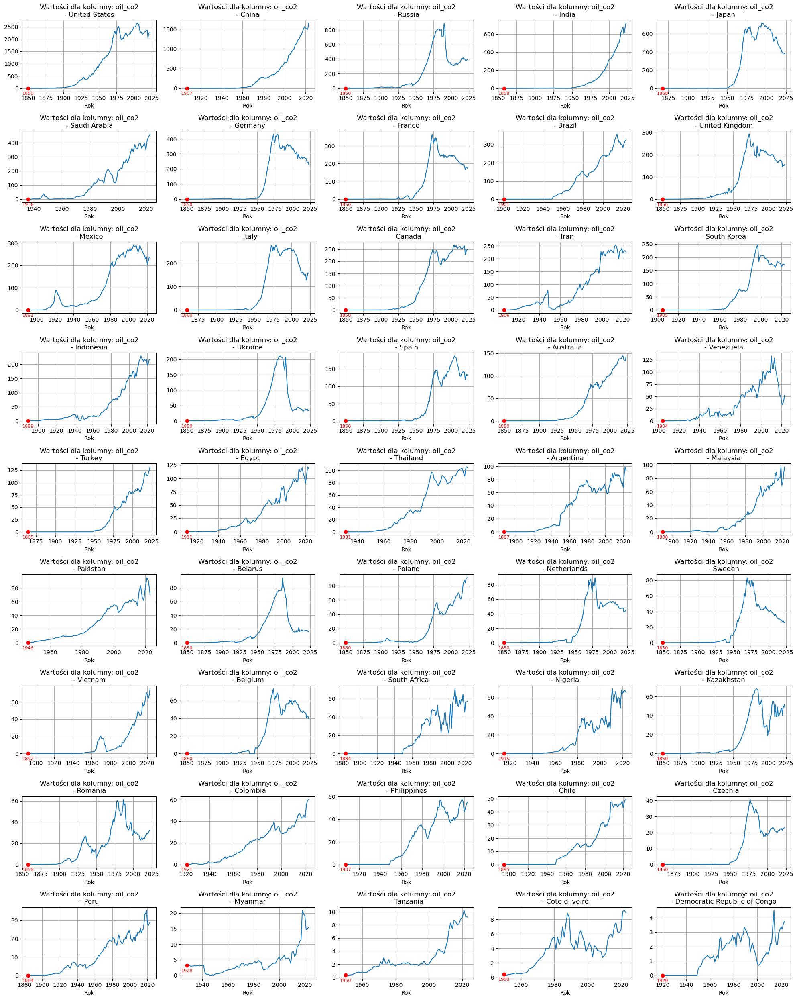

In [23]:
# Process data by filling missing values - max 7% are missing (because this is the same % for oil_co2 I use fill to all of that columns)
processed4_df_fill = data_preprocess.apply_process_country_data(processed4_df_before, column_oil, data_preprocess.process_country_data_fill)
data_charts.chart_missing_values(processed4_df_fill, column_oil)

In [24]:
data_missing.missing_values(processed4_df_fill)

year                            0.000000
country                         0.000000
population                      0.000000
gdp                            20.741562
primary_energy_consumption     60.545080
temperature_change_from_co2     0.237680
total_ghg                       0.000000
cement_co2                     26.445888
coal_co2                        0.000000
flaring_co2                     0.903185
gas_co2                         0.903185
land_use_change_co2             0.000000
oil_co2                         0.000000
co2_including_luc               0.000000
dtype: float64

2e. Check 'gas_co2' column

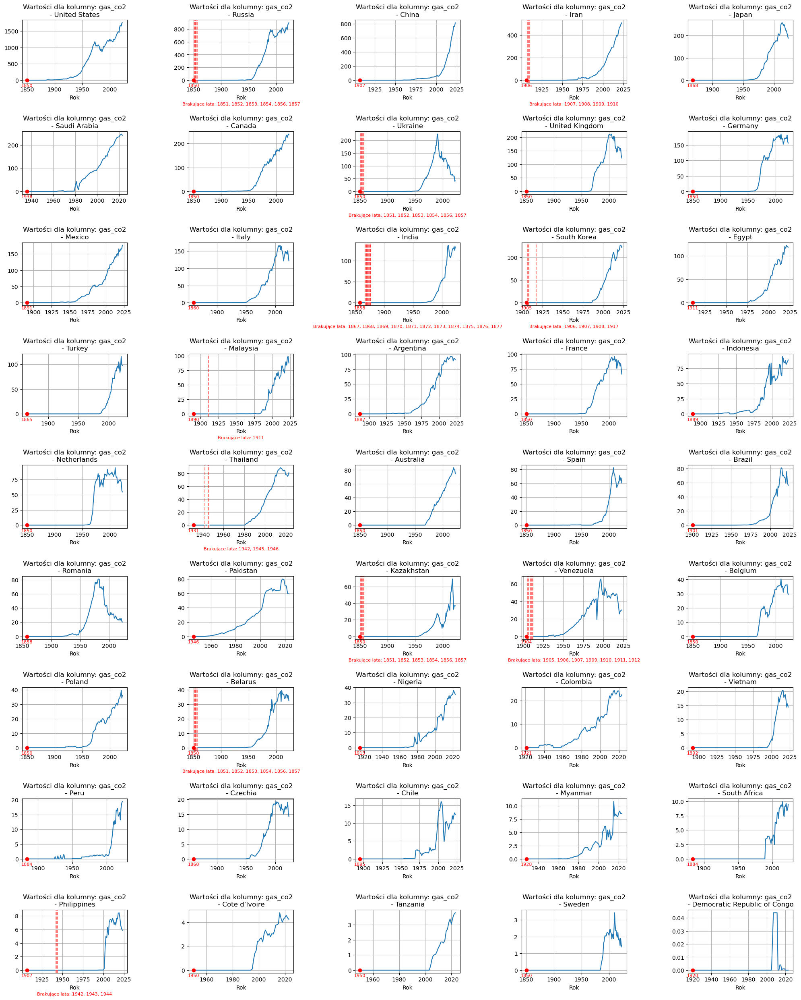

In [25]:
column_gas = 'gas_co2'
data_charts.chart_missing_values(processed4_df_fill, column_gas)

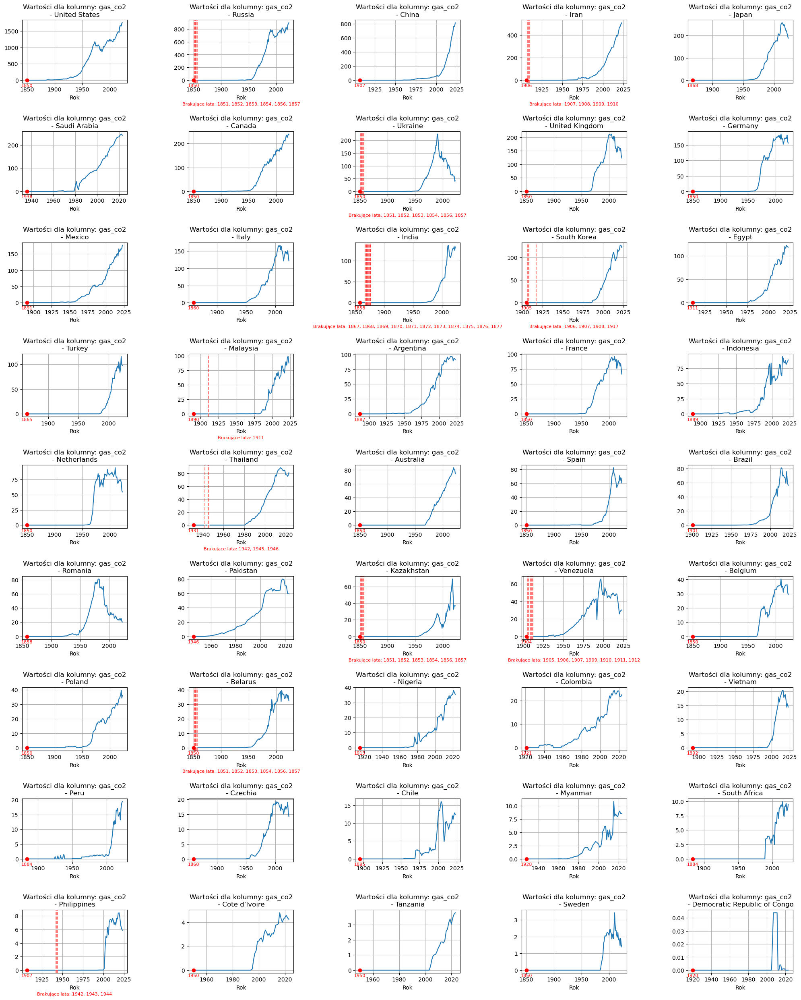

In [26]:
# Process data by removing missing values before the first non-null value
processed5_df_before = data_preprocess.apply_process_country_data(processed4_df_fill, column_gas, data_preprocess.process_country_data_before)
data_charts.chart_missing_values(processed5_df_before, column_gas)

In [27]:
data_missing.missing_values(processed5_df_before)

year                            0.000000
country                         0.000000
population                      0.000000
gdp                            20.741562
primary_energy_consumption     60.545080
temperature_change_from_co2     0.237680
total_ghg                       0.000000
cement_co2                     26.445888
coal_co2                        0.000000
flaring_co2                     0.903185
gas_co2                         0.903185
land_use_change_co2             0.000000
oil_co2                         0.000000
co2_including_luc               0.000000
dtype: float64

In [28]:
# Check missing values for each country
data_missing.calculate_missing_values_percentage(processed5_df_before, entity_column, column_gas)

,country,missing_percentage
0,India,6.626506
1,Venezuela,5.833333
2,Belarus,3.448276
3,Ukraine,3.448276
4,Kazakhstan,3.448276
5,Russia,3.448276
6,Iran,3.389831
7,South Korea,3.361345
8,Thailand,3.225806
9,Philippines,2.564103


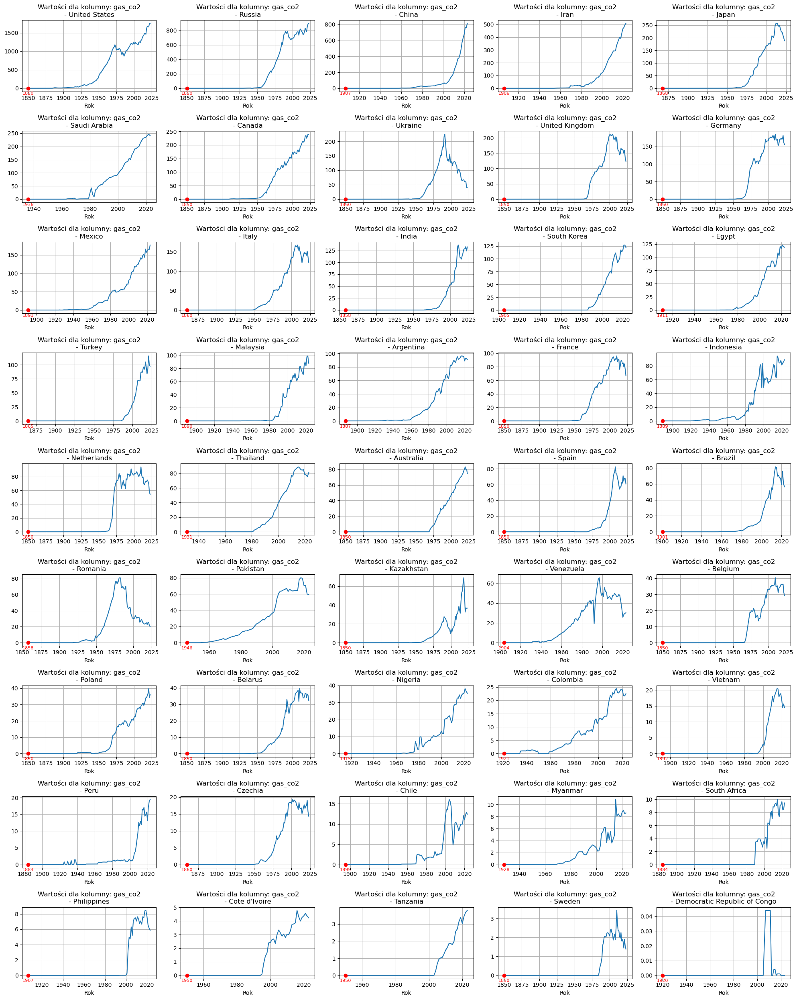

In [29]:
# Process data by filling missing values - max 7% are missing (because this is the same % for gas_co2 I use fill to all of that columns)
processed5_df_fill = data_preprocess.apply_process_country_data(processed5_df_before, column_gas, data_preprocess.process_country_data_fill)
data_charts.chart_missing_values(processed5_df_fill, column_gas)

In [30]:
data_missing.missing_values(processed5_df_fill)

year                            0.000000
country                         0.000000
population                      0.000000
gdp                            20.741562
primary_energy_consumption     60.545080
temperature_change_from_co2     0.237680
total_ghg                       0.000000
cement_co2                     26.445888
coal_co2                        0.000000
flaring_co2                     0.903185
gas_co2                         0.000000
land_use_change_co2             0.000000
oil_co2                         0.000000
co2_including_luc               0.000000
dtype: float64

2f. Check 'flaring_co2'

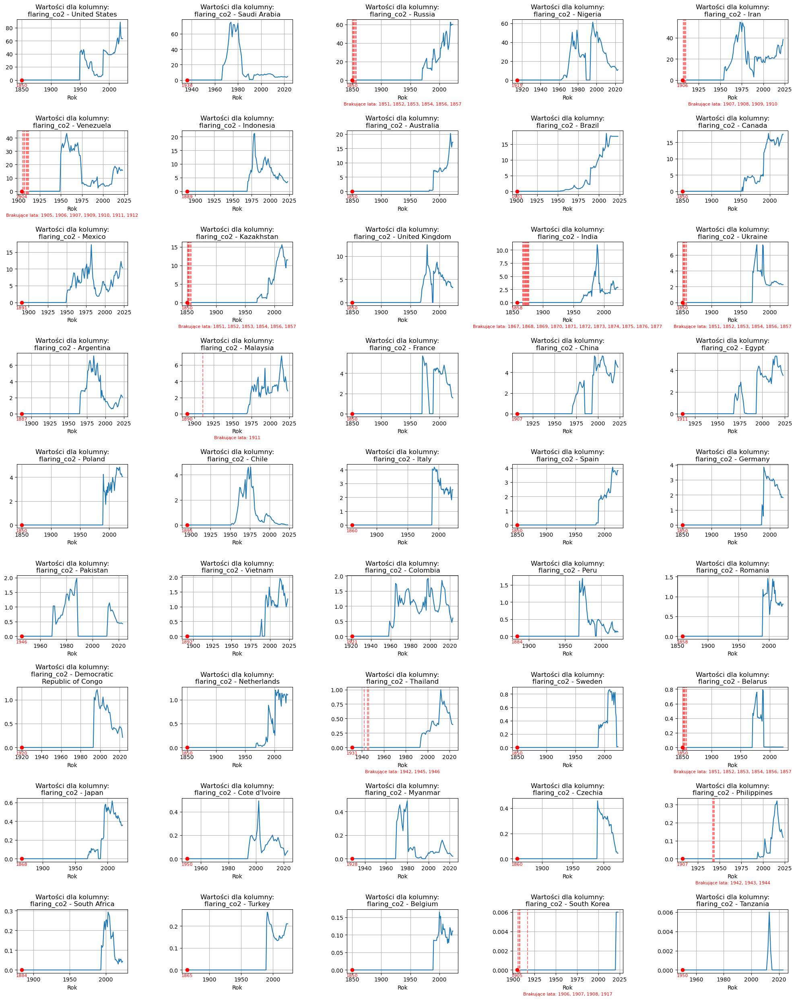

In [31]:
column_flaring = 'flaring_co2'
data_charts.chart_missing_values(processed5_df_fill, column_flaring)

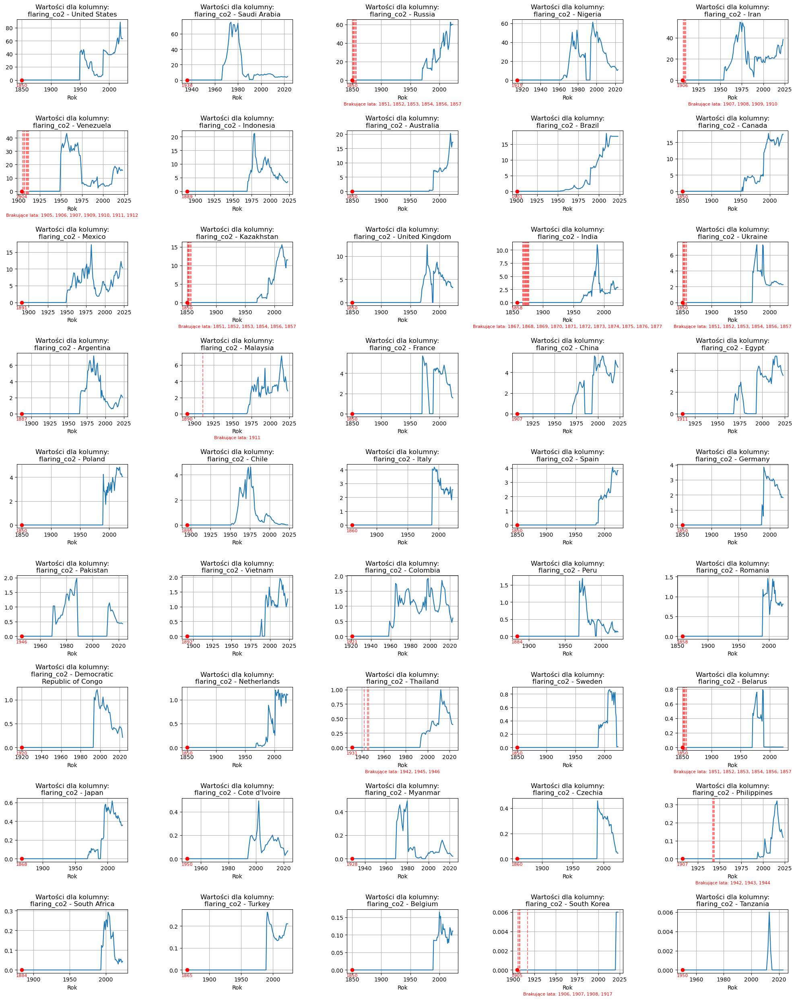

In [32]:
# Process data by removing missing values before the first non-null value
processed6_df_before = data_preprocess.apply_process_country_data(processed5_df_fill, column_flaring, data_preprocess.process_country_data_before)
data_charts.chart_missing_values(processed6_df_before, column_flaring)

In [33]:
data_missing.missing_values(processed6_df_before)

year                            0.000000
country                         0.000000
population                      0.000000
gdp                            20.741562
primary_energy_consumption     60.545080
temperature_change_from_co2     0.237680
total_ghg                       0.000000
cement_co2                     26.445888
coal_co2                        0.000000
flaring_co2                     0.903185
gas_co2                         0.000000
land_use_change_co2             0.000000
oil_co2                         0.000000
co2_including_luc               0.000000
dtype: float64

In [34]:
# Check missing values for each country
data_missing.calculate_missing_values_percentage(processed6_df_before, entity_column, column_flaring)

,country,missing_percentage
0,India,6.626506
1,Venezuela,5.833333
2,Belarus,3.448276
3,Ukraine,3.448276
4,Kazakhstan,3.448276
5,Russia,3.448276
6,Iran,3.389831
7,South Korea,3.361345
8,Thailand,3.225806
9,Philippines,2.564103


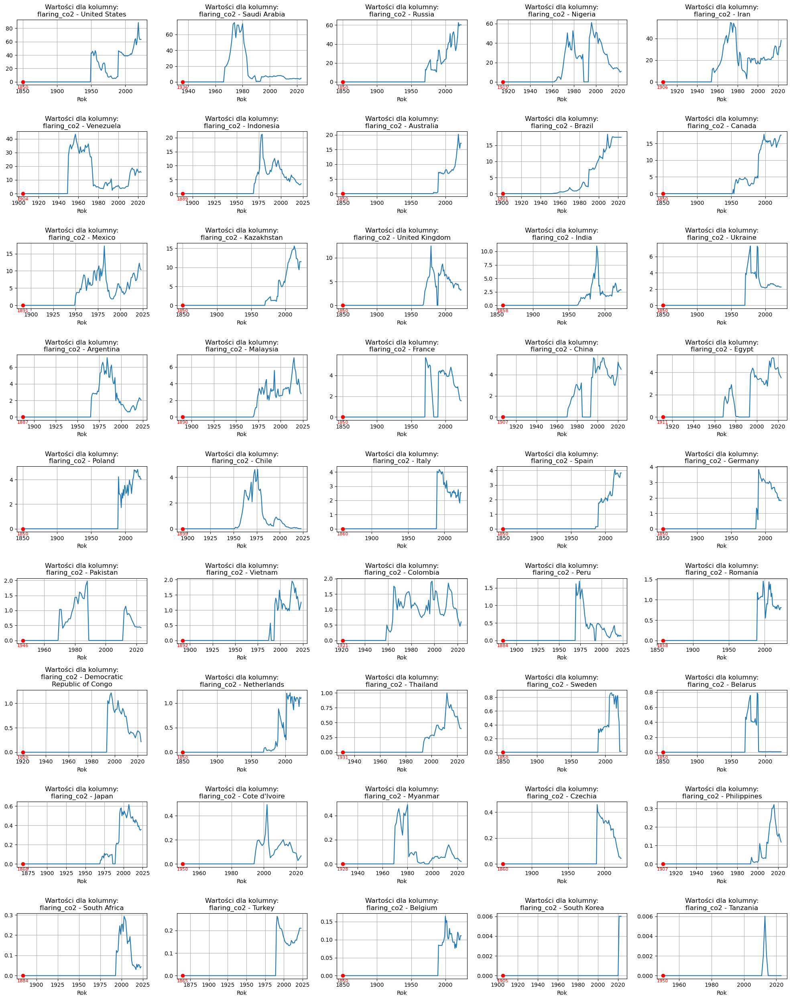

In [35]:
# Process data by filling missing values - max 7% are missing (because this is the same % for flaring_co2 I use fill to all of that columns)
processed6_df_fill = data_preprocess.apply_process_country_data(processed6_df_before, column_flaring, data_preprocess.process_country_data_fill)
data_charts.chart_missing_values(processed6_df_fill, column_flaring)

In [36]:
data_missing.missing_values(processed6_df_fill)

year                            0.000000
country                         0.000000
population                      0.000000
gdp                            20.741562
primary_energy_consumption     60.545080
temperature_change_from_co2     0.237680
total_ghg                       0.000000
cement_co2                     26.445888
coal_co2                        0.000000
flaring_co2                     0.000000
gas_co2                         0.000000
land_use_change_co2             0.000000
oil_co2                         0.000000
co2_including_luc               0.000000
dtype: float64

2g. Check 'temperature_change_from_co2' column

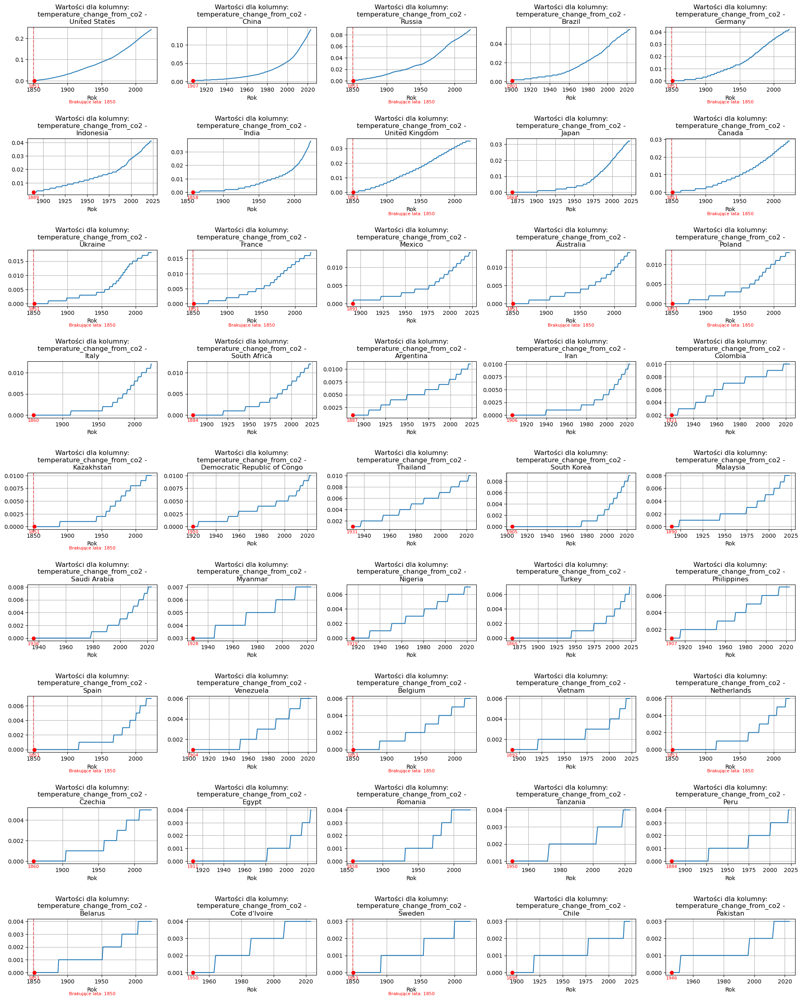

In [37]:
column_temp = 'temperature_change_from_co2'
data_charts.chart_missing_values(processed6_df_fill, column_temp)

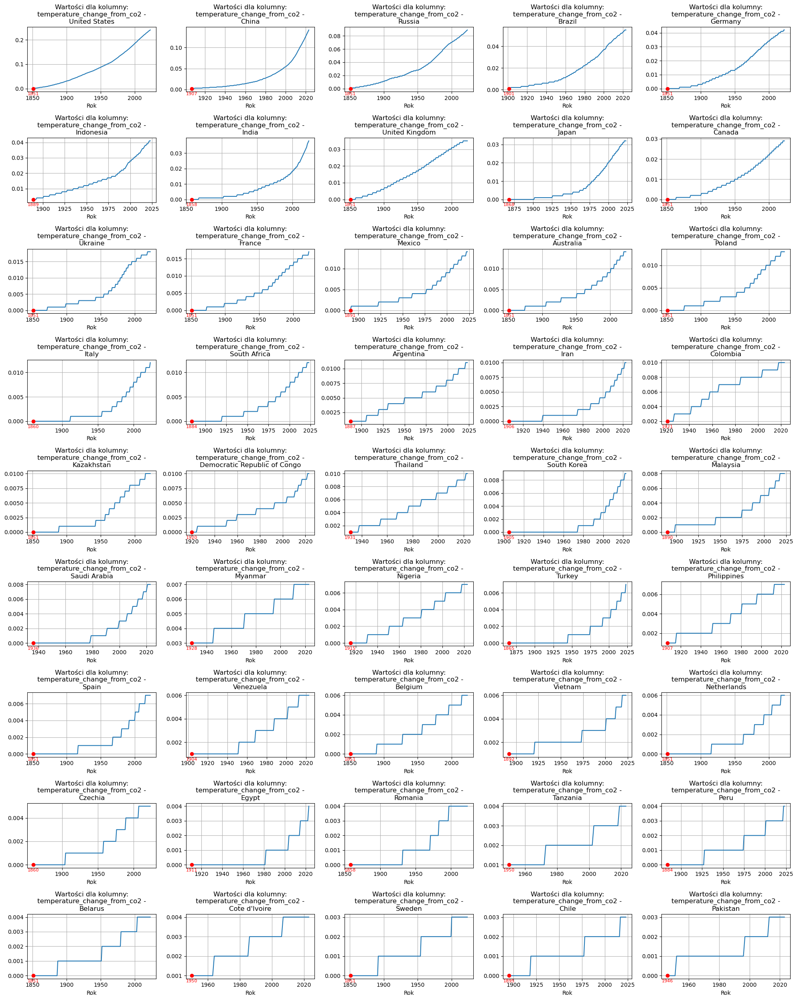

In [38]:
# Process data by removing missing values before the first non-null value
processed7_df_before = data_preprocess.apply_process_country_data(processed6_df_fill, column_temp, data_preprocess.process_country_data_before)
data_charts.chart_missing_values(processed7_df_before, column_temp)

In [39]:
data_missing.missing_values(processed7_df_before)

year                            0.000000
country                         0.000000
population                      0.000000
gdp                            20.727446
primary_energy_consumption     60.451080
temperature_change_from_co2     0.000000
total_ghg                       0.000000
cement_co2                     26.302414
coal_co2                        0.000000
flaring_co2                     0.000000
gas_co2                         0.000000
land_use_change_co2             0.000000
oil_co2                         0.000000
co2_including_luc               0.000000
dtype: float64

2h. Check 'gdp' column

/Users/majarusak/Desktop/Areas/Praca_magisterska/co2_repo/src/data_preparation/data_cleaning.py:122: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


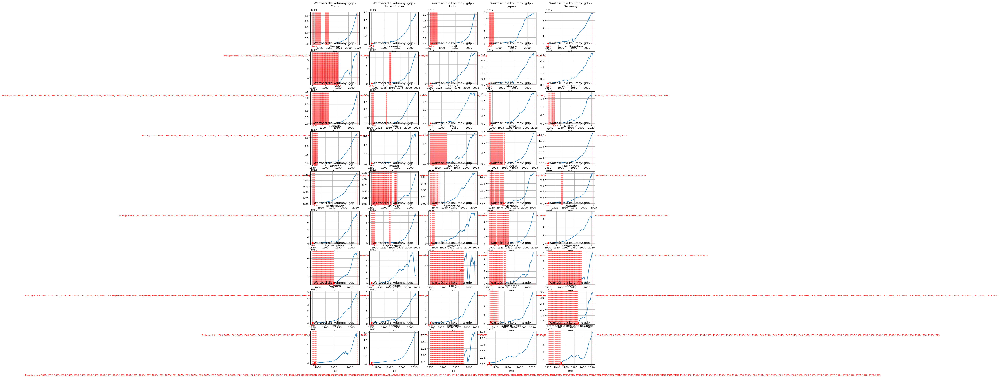

In [40]:
column_gdp = 'gdp'
data_charts.chart_missing_values(processed7_df_before, column_gdp)

/Users/majarusak/Desktop/Areas/Praca_magisterska/co2_repo/src/data_preparation/data_cleaning.py:122: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.tight_layout()


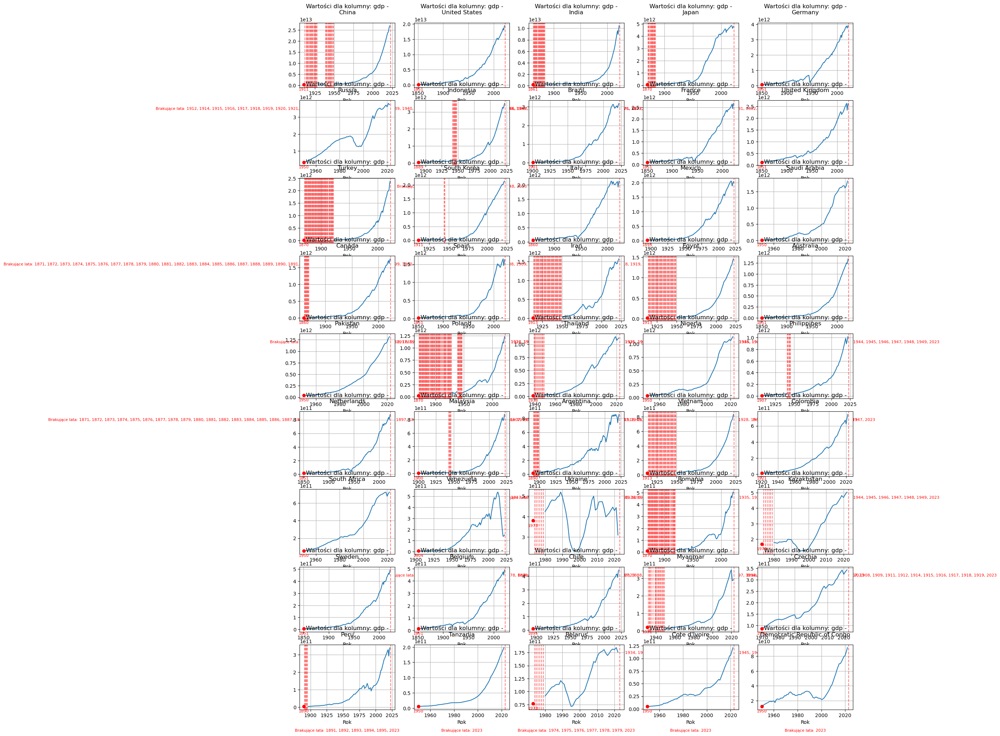

In [41]:
# Process data by removing missing values before the first non-null value
processed8_df_before = data_preprocess.apply_process_country_data(processed7_df_before, column_gdp, data_preprocess.process_country_data_before)
data_charts.chart_missing_values(processed8_df_before, column_gdp)

In [42]:
data_missing.missing_values(processed8_df_before)

year                            0.000000
country                         0.000000
population                      0.000000
gdp                             8.405212
primary_energy_consumption     54.395302
temperature_change_from_co2     0.000000
total_ghg                       0.000000
cement_co2                     22.334373
coal_co2                        0.000000
flaring_co2                     0.000000
gas_co2                         0.000000
land_use_change_co2             0.000000
oil_co2                         0.000000
co2_including_luc               0.000000
dtype: float64

In [43]:
# Check missing values for each country
missing_gdp = data_missing.calculate_missing_values_percentage(processed8_df_before, entity_column, column_gdp)
missing_gdp

,country,missing_percentage
0,Poland,40.909091
1,Turkey,33.766234
2,Vietnam,33.333333
3,Egypt,33.333333
4,Iran,33.333333
5,Romania,29.870130
6,China,24.778761
7,Myanmar,18.279570
8,Thailand,13.953488
9,Belarus,13.725490


In [44]:
missing_gdp[missing_gdp['missing_percentage'] > 7]['country'].unique()

array(['Poland', 'Turkey', 'Vietnam', 'Egypt', 'Iran', 'Romania', 'China',
       'Myanmar', 'Thailand', 'Belarus', 'Ukraine', 'Kazakhstan', 'India',
       'Japan', 'Argentina'], dtype=object)

In [45]:
#Process data

#Filter data on 2 datasets, where missing values > 7% and <= 7%
unique_countries_more_than_7_gdp = missing_gdp[missing_gdp['missing_percentage'] > 7]['country'].unique()
unique_countries_less_than_7_gdp = missing_gdp[missing_gdp['missing_percentage'] <= 7]['country'].unique()

processed6_df_more_than_7_gdp = processed8_df_before[processed8_df_before['country'].isin(unique_countries_more_than_7_gdp)]
processed6_df_less_than_7_gdp = processed8_df_before[processed8_df_before['country'].isin(unique_countries_less_than_7_gdp)]

#Missing values > 7% are removed
processed8_df_after = data_preprocess.apply_process_country_data(processed6_df_more_than_7_gdp, column_gdp, data_preprocess.process_country_data_after)

#Missing values <= 7% are filled
processed8_df_fill = data_preprocess.apply_process_country_data(processed6_df_less_than_7_gdp, column_gdp, data_preprocess.process_country_data_fill)

# Combine the two processed DataFrames into one
processed8_df = pd.concat([processed8_df_after, processed8_df_fill]).reset_index(drop=True)

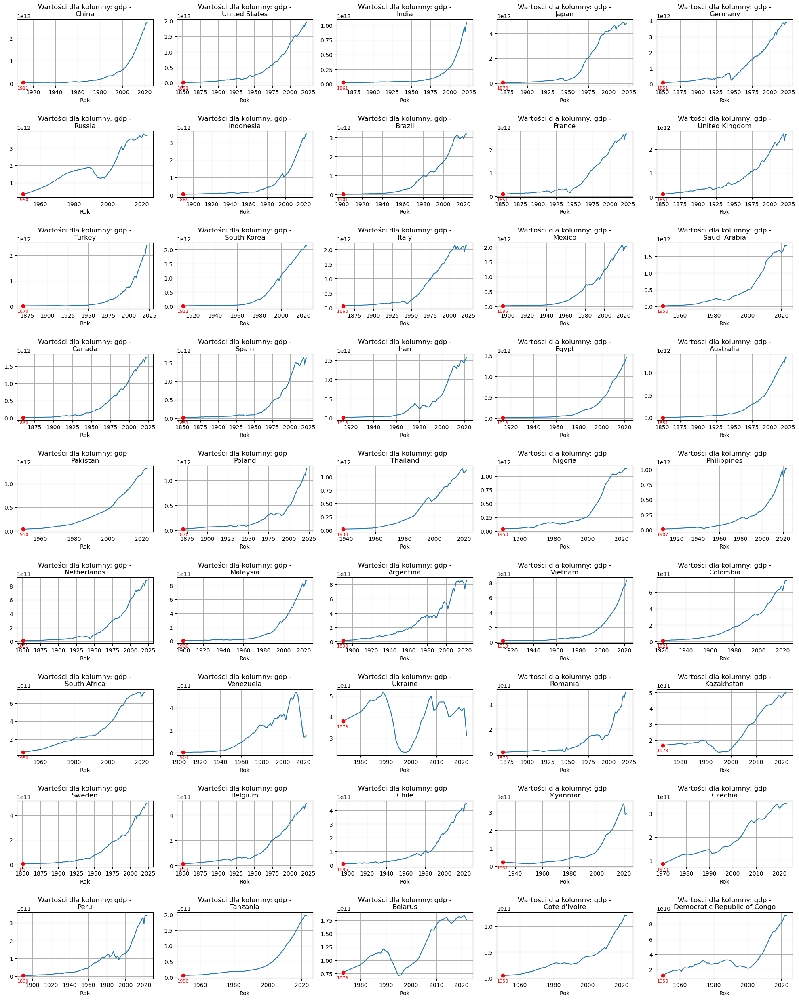

In [46]:
#Line chart
data_charts.chart_missing_values(processed8_df, column_gdp)

In [47]:
data_missing.missing_values(processed8_df)

year                            0.000000
country                         0.000000
population                      0.000000
gdp                             0.000000
primary_energy_consumption     51.098357
temperature_change_from_co2     0.000000
total_ghg                       0.000000
cement_co2                     19.394419
coal_co2                        0.000000
flaring_co2                     0.000000
gas_co2                         0.000000
land_use_change_co2             0.000000
oil_co2                         0.000000
co2_including_luc               0.000000
dtype: float64

2i. Check 'cement_co2' column

/Users/majarusak/Desktop/Areas/Praca_magisterska/co2_repo/src/data_preparation/data_cleaning.py:122: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


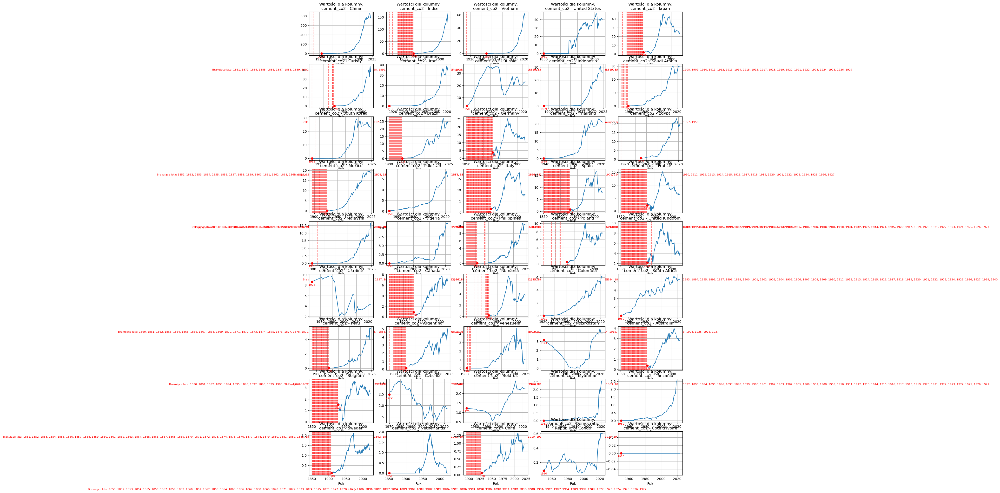

In [48]:
column_cement = 'cement_co2'
data_charts.chart_missing_values(processed8_df, column_cement)

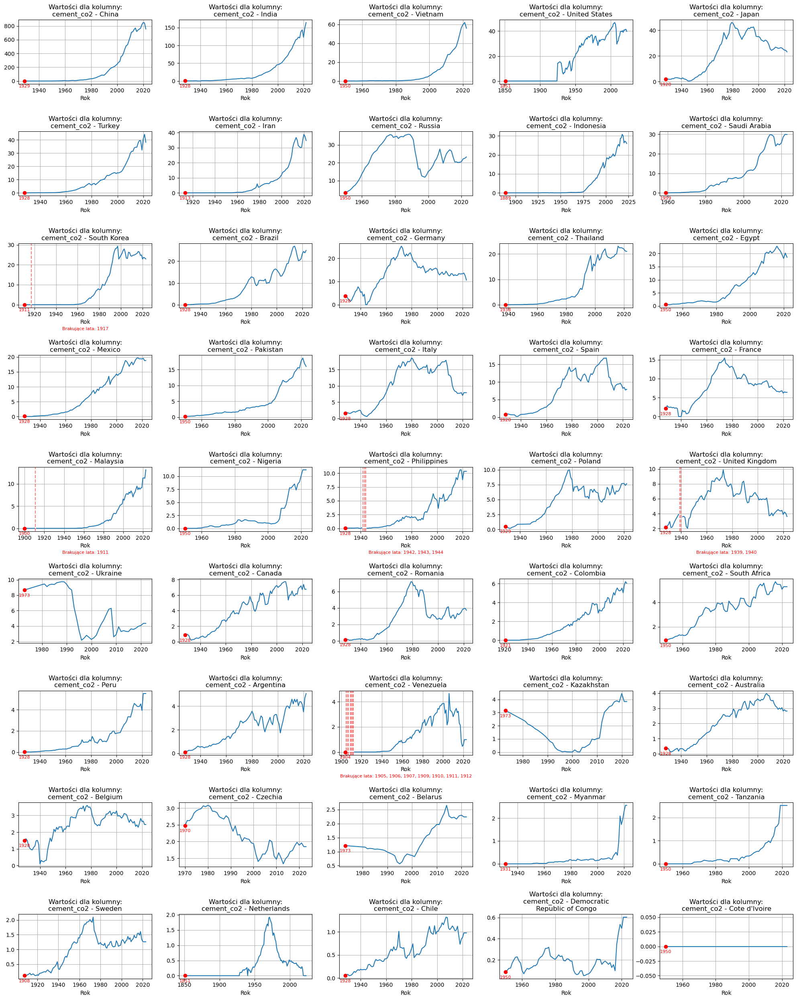

In [49]:
# Process data by removing missing values before the first non-null value
processed9_df_before = data_preprocess.apply_process_country_data(processed8_df, column_cement, data_preprocess.process_country_data_before)
data_charts.chart_missing_values(processed9_df_before, column_cement)

In [50]:
data_missing.missing_values(processed9_df_before)

year                            0.000000
country                         0.000000
population                      0.000000
gdp                             0.000000
primary_energy_consumption     39.540005
temperature_change_from_co2     0.000000
total_ghg                       0.000000
cement_co2                      0.342550
coal_co2                        0.000000
flaring_co2                     0.000000
gas_co2                         0.000000
land_use_change_co2             0.000000
oil_co2                         0.000000
co2_including_luc               0.000000
dtype: float64

In [51]:
# Check missing values for each country
missing_cement = data_missing.calculate_missing_values_percentage(processed9_df_before, entity_column, column_cement)
missing_cement

,country,missing_percentage
0,Venezuela,5.833333
1,Philippines,3.125000
2,United Kingdom,2.083333
3,South Korea,0.884956
4,Malaysia,0.806452
5,Saudi Arabia,0.000000
6,Nigeria,0.000000
7,Pakistan,0.000000
8,Peru,0.000000
9,Poland,0.000000


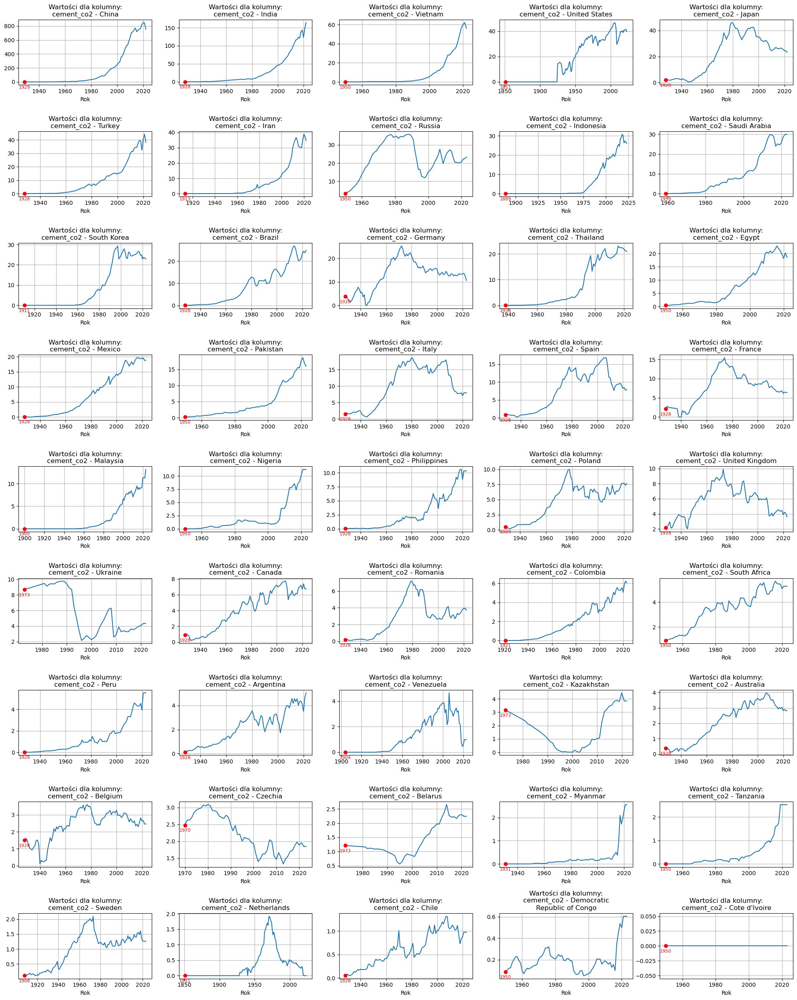

In [52]:
# Process data by filling missing values - max 7% missing
processed9_df_fill = data_preprocess.apply_process_country_data(processed9_df_before, column_cement, data_preprocess.process_country_data_fill)
data_charts.chart_missing_values(processed9_df_fill, column_cement)

In [53]:
data_missing.missing_values(processed9_df_fill)

year                            0.000000
country                         0.000000
population                      0.000000
gdp                             0.000000
primary_energy_consumption     39.540005
temperature_change_from_co2     0.000000
total_ghg                       0.000000
cement_co2                      0.000000
coal_co2                        0.000000
flaring_co2                     0.000000
gas_co2                         0.000000
land_use_change_co2             0.000000
oil_co2                         0.000000
co2_including_luc               0.000000
dtype: float64

2f. Remove 'primary_energy_consumption' column

In [54]:
# Primary energy consumption and total ghg has still a lot of missing values so I assume to just remove them
processed9_df = processed9_df_fill.drop(columns={'primary_energy_consumption'})
processed9_df

,year,country,population,gdp,temperature_change_from_co2,total_ghg,cement_co2,coal_co2,flaring_co2,gas_co2,land_use_change_co2,oil_co2,co2_including_luc
0,1928,Argentina,11139114.0,7.716888e+10,0.003,264.874,0.116,7.736,0.000,0.297,228.929,4.041,241.120
1,1929,Argentina,11443159.0,8.069191e+10,0.003,267.222,0.174,7.798,0.000,0.458,229.747,4.177,242.354
2,1930,Argentina,11726853.0,7.735969e+10,0.003,245.265,0.189,7.690,0.000,0.454,181.916,4.005,194.254
3,1931,Argentina,11989069.0,7.199214e+10,0.004,231.726,0.265,6.569,0.000,0.564,150.307,5.067,162.773
4,1932,Argentina,12228636.0,6.962483e+10,0.004,225.496,0.247,6.129,0.000,0.769,132.772,5.752,145.669
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4082,2019,Venezuela,28938095.0,1.971709e+11,0.006,195.117,0.453,0.286,17.938,34.475,8.805,52.135,114.092
4083,2020,Venezuela,28444078.0,1.380295e+11,0.006,165.075,0.580,0.198,16.147,25.714,7.525,38.289,88.452
4084,2021,Venezuela,28237831.0,1.386561e+11,0.006,160.525,0.986,0.198,15.395,28.601,12.041,33.280,90.501
4085,2022,Venezuela,28213016.0,1.496821e+11,0.006,163.484,0.986,0.673,16.190,29.617,4.907,40.049,92.422


In [55]:
data_missing.missing_values(processed9_df)

year                           0.0
country                        0.0
population                     0.0
gdp                            0.0
temperature_change_from_co2    0.0
total_ghg                      0.0
cement_co2                     0.0
coal_co2                       0.0
flaring_co2                    0.0
gas_co2                        0.0
land_use_change_co2            0.0
oil_co2                        0.0
co2_including_luc              0.0
dtype: float64

3. Final co2 emission

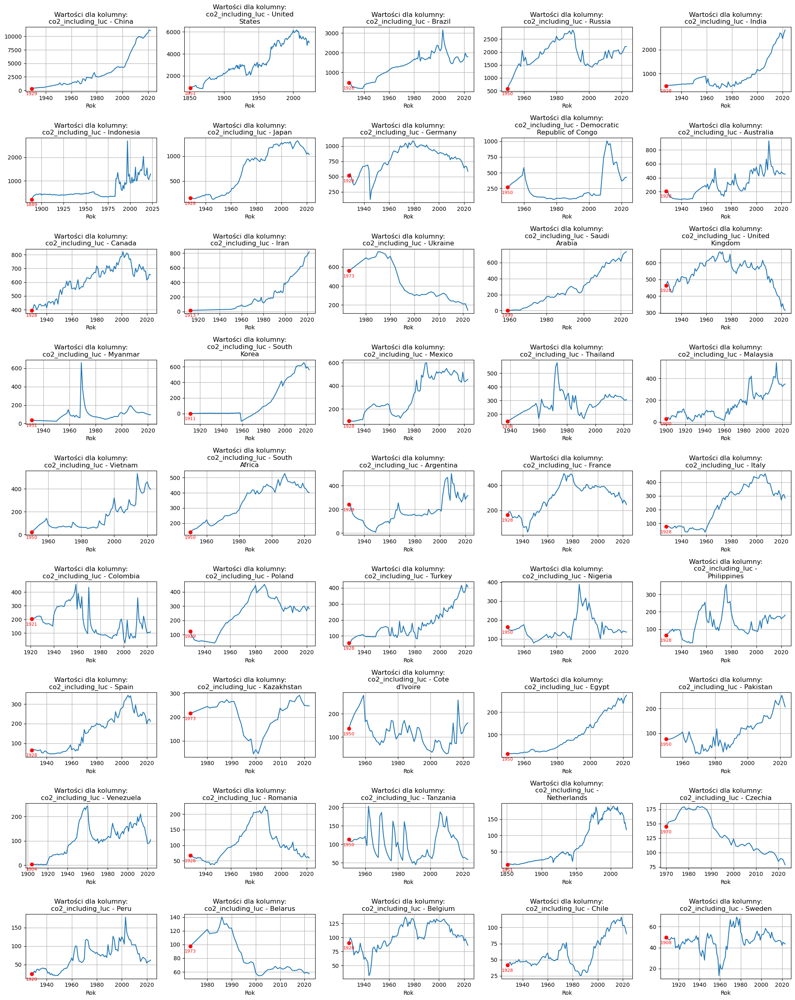

In [56]:
#Final co2 emission line charts
data_charts.chart_missing_values(processed9_df, column_co2)

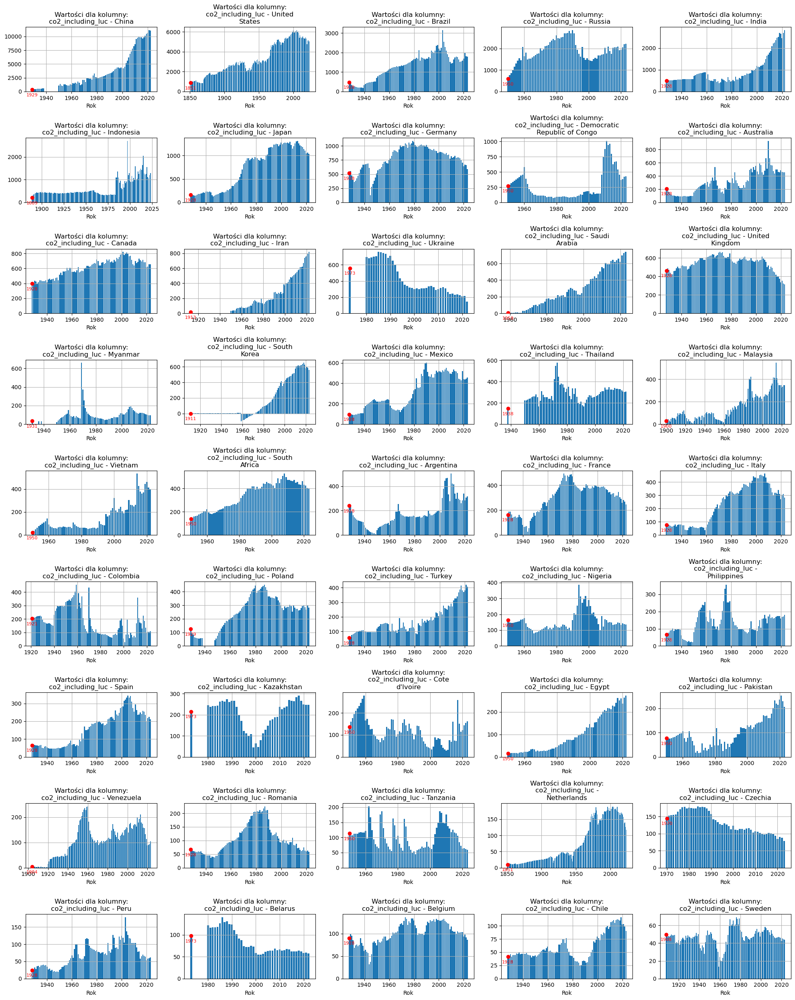

In [57]:
data_charts.chart_missing_values(processed9_df, column_co2, 'bar')

In [58]:
#when I removed all missing values - 3998 stayed
#when I filled missing values - 4164 stayed
#when I filled most missing values, ony gdp removed for some countries - 4027 stayed
processed9_df = processed9_df.sort_values(by=['country', 'year']).reset_index(drop=True)
processed9_df

,year,country,population,gdp,temperature_change_from_co2,total_ghg,cement_co2,coal_co2,flaring_co2,gas_co2,land_use_change_co2,oil_co2,co2_including_luc
0,1928,Argentina,11139114.0,7.716888e+10,0.003,264.874,0.116,7.736,0.000,0.297,228.929,4.041,241.120
1,1929,Argentina,11443159.0,8.069191e+10,0.003,267.222,0.174,7.798,0.000,0.458,229.747,4.177,242.354
2,1930,Argentina,11726853.0,7.735969e+10,0.003,245.265,0.189,7.690,0.000,0.454,181.916,4.005,194.254
3,1931,Argentina,11989069.0,7.199214e+10,0.004,231.726,0.265,6.569,0.000,0.564,150.307,5.067,162.773
4,1932,Argentina,12228636.0,6.962483e+10,0.004,225.496,0.247,6.129,0.000,0.769,132.772,5.752,145.669
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4082,2018,Vietnam,96237319.0,6.815014e+11,0.005,470.571,49.637,122.121,1.373,18.554,113.943,63.633,369.262
4083,2019,Vietnam,97173778.0,7.316531e+11,0.006,543.980,56.538,191.443,1.453,18.906,103.356,70.808,442.503
4084,2020,Vietnam,98079196.0,7.526296e+11,0.006,560.892,60.066,215.817,1.257,16.931,98.147,68.389,460.607
4085,2021,Vietnam,98935101.0,7.719120e+11,0.006,517.077,62.071,172.395,0.995,14.436,99.431,64.076,413.404


In [59]:
# Function to check if the year column is continuous for each country
def check_non_continuous_years(df):
    non_continuous_countries = []
    for country in df['country'].unique():
        country_df = df[df['country'] == country].sort_values(by='year')
        years = country_df['year'].tolist()
        continuous = all(years[i] + 1 == years[i + 1] for i in range(len(years) - 1))
        if not continuous:
            non_continuous_countries.append(country)
    return non_continuous_countries

# Function to remove isolated years if data is not continuous
def remove_isolated_years(df):
    new_df = pd.DataFrame()
    for country in df['country'].unique():
        country_df = df[df['country'] == country].sort_values(by='year')
        years = country_df['year'].tolist()
        if not all(years[i] + 1 == years[i + 1] for i in range(len(years) - 1)):
            first_continuous_year = years[1]  # Assume the first non-continuous year is an outlier
            new_country_df = country_df[country_df['year'] >= first_continuous_year]
            new_df = pd.concat([new_df, new_country_df])
        else:
            new_df = pd.concat([new_df, country_df])
    return new_df

non_continuous_countries = check_non_continuous_years(processed9_df)
cleaned_df = processed9_df.copy()
iteration = 1
while non_continuous_countries:
    print(f"Iteration {iteration}: Non-continuous countries: {non_continuous_countries}")
    cleaned_df = remove_isolated_years(cleaned_df)
    non_continuous_countries = check_non_continuous_years(cleaned_df)
    iteration += 1

cleaned_df


Iteration 1: Non-continuous countries: ['Belarus', 'China', 'Iran', 'Kazakhstan', 'Myanmar', 'Poland', 'Thailand', 'Ukraine']
Iteration 2: Non-continuous countries: ['China', 'Myanmar', 'Poland']
Iteration 3: Non-continuous countries: ['China', 'Myanmar', 'Poland']
Iteration 4: Non-continuous countries: ['China', 'Poland']
Iteration 5: Non-continuous countries: ['China', 'Poland']
Iteration 6: Non-continuous countries: ['China', 'Poland']
Iteration 7: Non-continuous countries: ['China', 'Poland']
Iteration 8: Non-continuous countries: ['China', 'Poland']
Iteration 9: Non-continuous countries: ['China', 'Poland']
Iteration 10: Non-continuous countries: ['China', 'Poland']


,year,country,population,gdp,temperature_change_from_co2,total_ghg,cement_co2,coal_co2,flaring_co2,gas_co2,land_use_change_co2,oil_co2,co2_including_luc
0,1928,Argentina,11139114.0,7.716888e+10,0.003,264.874,0.116,7.736,0.000,0.297,228.929,4.041,241.120
1,1929,Argentina,11443159.0,8.069191e+10,0.003,267.222,0.174,7.798,0.000,0.458,229.747,4.177,242.354
2,1930,Argentina,11726853.0,7.735969e+10,0.003,245.265,0.189,7.690,0.000,0.454,181.916,4.005,194.254
3,1931,Argentina,11989069.0,7.199214e+10,0.004,231.726,0.265,6.569,0.000,0.564,150.307,5.067,162.773
4,1932,Argentina,12228636.0,6.962483e+10,0.004,225.496,0.247,6.129,0.000,0.769,132.772,5.752,145.669
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4082,2018,Vietnam,96237319.0,6.815014e+11,0.005,470.571,49.637,122.121,1.373,18.554,113.943,63.633,369.262
4083,2019,Vietnam,97173778.0,7.316531e+11,0.006,543.980,56.538,191.443,1.453,18.906,103.356,70.808,442.503
4084,2020,Vietnam,98079196.0,7.526296e+11,0.006,560.892,60.066,215.817,1.257,16.931,98.147,68.389,460.607
4085,2021,Vietnam,98935101.0,7.719120e+11,0.006,517.077,62.071,172.395,0.995,14.436,99.431,64.076,413.404


In [60]:
cleaned_df.isna().sum()

year                           0
country                        0
population                     0
gdp                            0
temperature_change_from_co2    0
total_ghg                      0
cement_co2                     0
coal_co2                       0
flaring_co2                    0
gas_co2                        0
land_use_change_co2            0
oil_co2                        0
co2_including_luc              0
dtype: int64

In [61]:
cleaned_df = cleaned_df.sort_values(by=['country', 'year']).reset_index(drop=True)
cleaned_df

,year,country,population,gdp,temperature_change_from_co2,total_ghg,cement_co2,coal_co2,flaring_co2,gas_co2,land_use_change_co2,oil_co2,co2_including_luc
0,1928,Argentina,11139114.0,7.716888e+10,0.003,264.874,0.116,7.736,0.000,0.297,228.929,4.041,241.120
1,1929,Argentina,11443159.0,8.069191e+10,0.003,267.222,0.174,7.798,0.000,0.458,229.747,4.177,242.354
2,1930,Argentina,11726853.0,7.735969e+10,0.003,245.265,0.189,7.690,0.000,0.454,181.916,4.005,194.254
3,1931,Argentina,11989069.0,7.199214e+10,0.004,231.726,0.265,6.569,0.000,0.564,150.307,5.067,162.773
4,1932,Argentina,12228636.0,6.962483e+10,0.004,225.496,0.247,6.129,0.000,0.769,132.772,5.752,145.669
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4054,2018,Vietnam,96237319.0,6.815014e+11,0.005,470.571,49.637,122.121,1.373,18.554,113.943,63.633,369.262
4055,2019,Vietnam,97173778.0,7.316531e+11,0.006,543.980,56.538,191.443,1.453,18.906,103.356,70.808,442.503
4056,2020,Vietnam,98079196.0,7.526296e+11,0.006,560.892,60.066,215.817,1.257,16.931,98.147,68.389,460.607
4057,2021,Vietnam,98935101.0,7.719120e+11,0.006,517.077,62.071,172.395,0.995,14.436,99.431,64.076,413.404


In [62]:
cleaned_df = cleaned_df.rename(columns={"co2_including_luc": "co2"})

In [63]:
# Save in csv
cleaned_df.to_csv(os.path.join(config.output_cleaned, 'data_cleaned.csv'), index=False)